In [1]:
%load_ext autoreload
%autoreload 2
from context import rmlib
import rmlib.rmtools as rm
import random
import time
import math
import pprint
import pickle
import gzip
import os.path
from os import path

config = {
    'active_components' : {
        'camera' : ['my_camera'],
        'hand' : ['my_hand'],
        'arm' : ['my_arm'],
        'cart' : [],
    },
    'my_components' : {
        'my_hand' : {
            "module_name" : "hands.vgc10",
            "class_name" : "VGC10",
            "finger_length": 0.0415,
            "finger_width_outer" : 0.015,
            "finger_width_inner" : 0.0,
            "finger_depth" : 0.014
        },
        'my_arm' : {
            "module_name" : "arms.ur5",
            "class_name" : "UR5",
            "ip_address" : "10.1.12.81",
            "xmlrpc_port" : "8003",
            "max_linear_speed" : 0.25,
            "max_linear_accel" : 1.2,
            "max_joint_speed" : 1.05,
            "max_joint_accel" : 1.4,
            "default_linear_speed" : 0.1,
            "default_joint_speed" : 0.7,
            "default_linear_accel" : 0.8,
            "default_joint_accel" : 0.8,
            
        },
        'my_camera' : {
            'module_name' : 'cameras.realsense',
            'class_name' : 'RealSense',
            'camera_model' : 'd415',
            'ci_cam_offset' : [-0.0179, -0.0753, -0.02],
            'pc_cam_offset' : [-0.0179, -0.0753, -0.02],
        },        
    },
}
robot = rmlib.robot.Robot(config)

Setting up robot please wait...
Robot Ready!


# Setup

In [11]:
robot.arm.move_to_common_pose('cv_2')

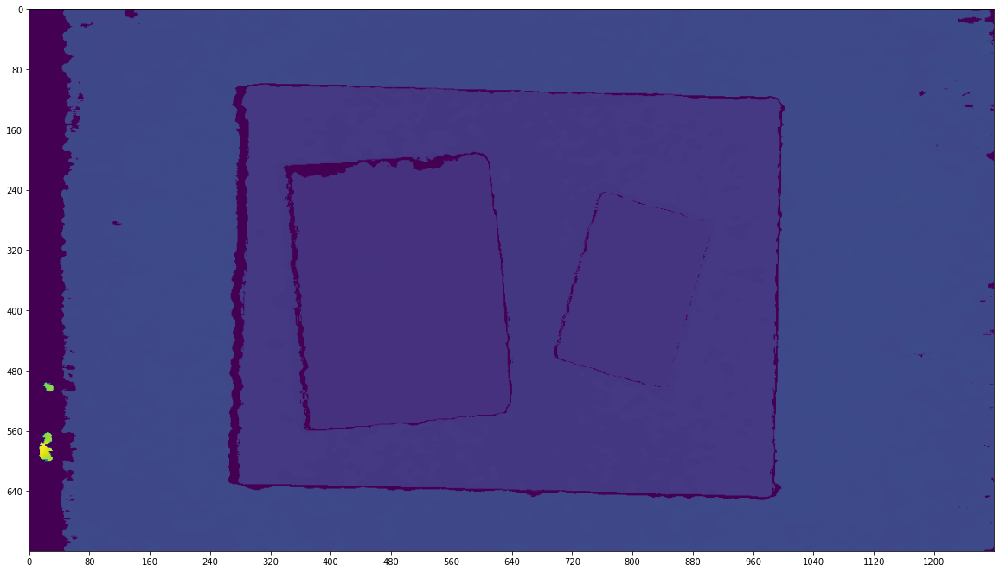

In [12]:
# Set disparity shift
robot.camera.set_disparity_shift_dist(0.7)
robot.get_and_view_depth()

In [4]:
# Set range
x_range = [-0.2, 0.2] # meters
y_range = [-0.075, 0.05] # meters
z_range = [0, 0.15] # meters
rz_range = [-30, 30] # Deg
common_pose = 'cv_2'

# Test extremes

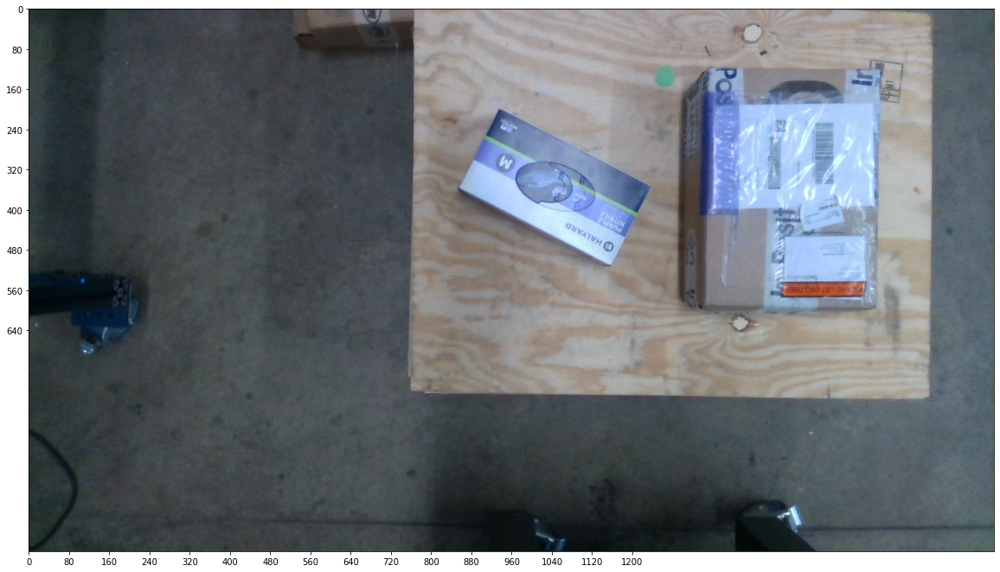

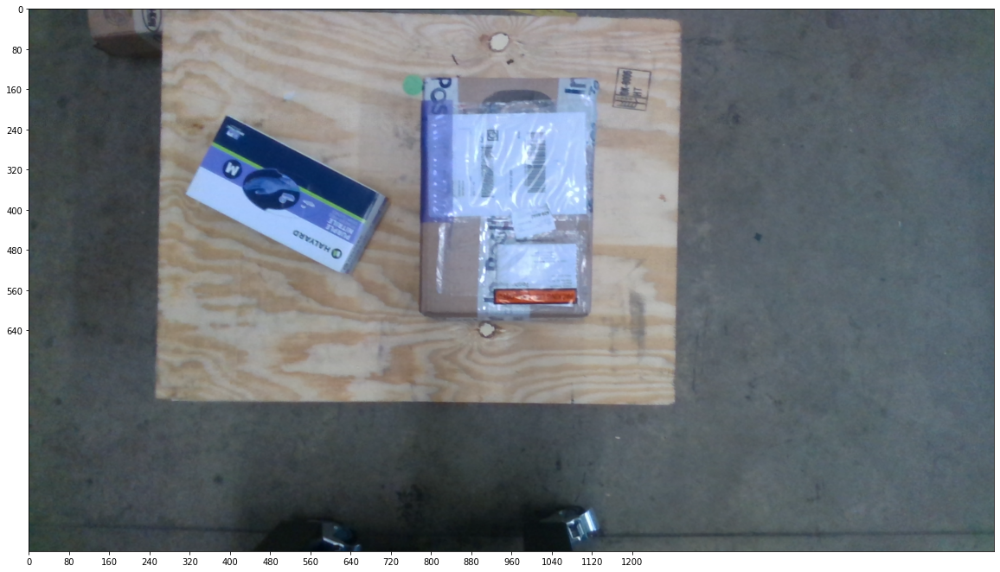

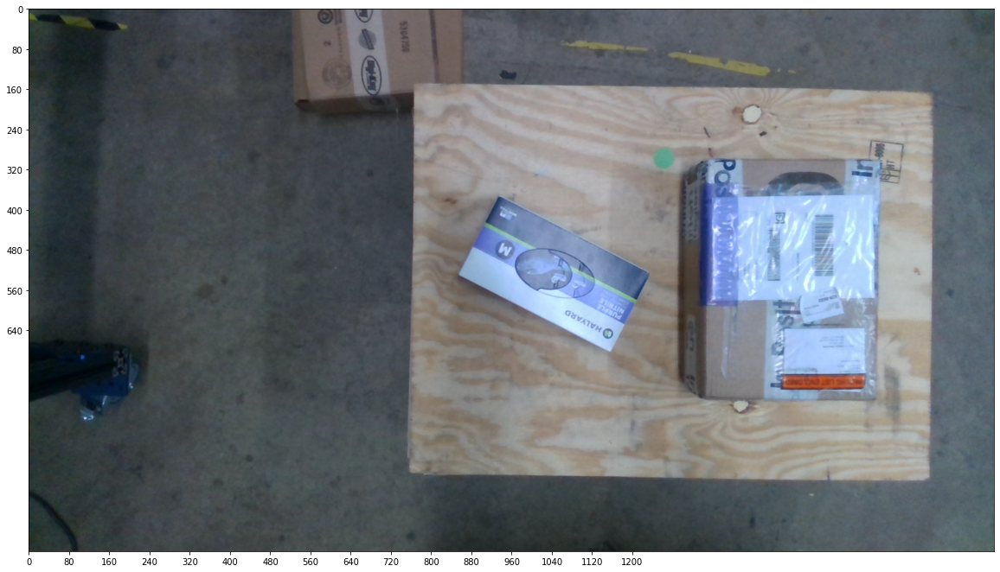

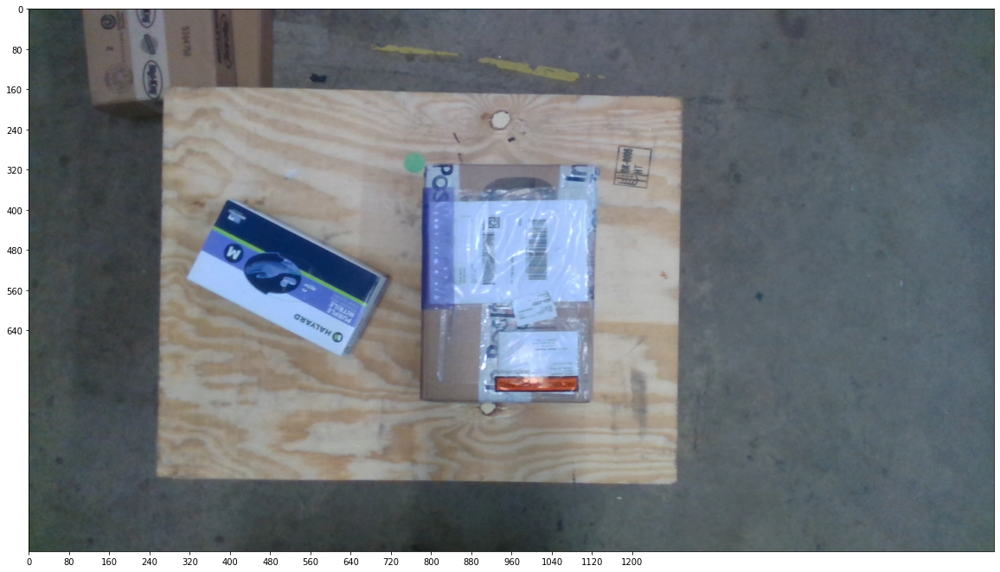

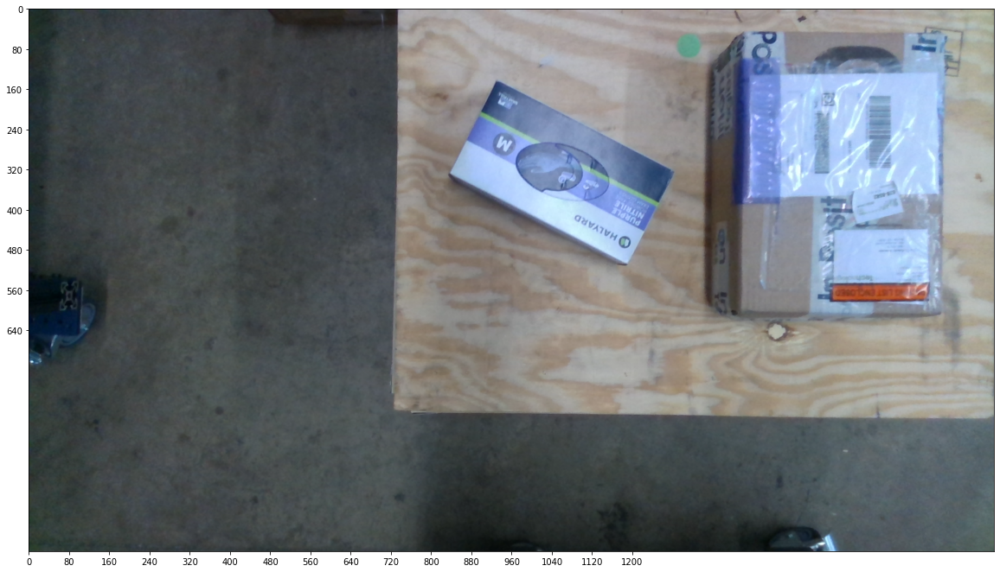

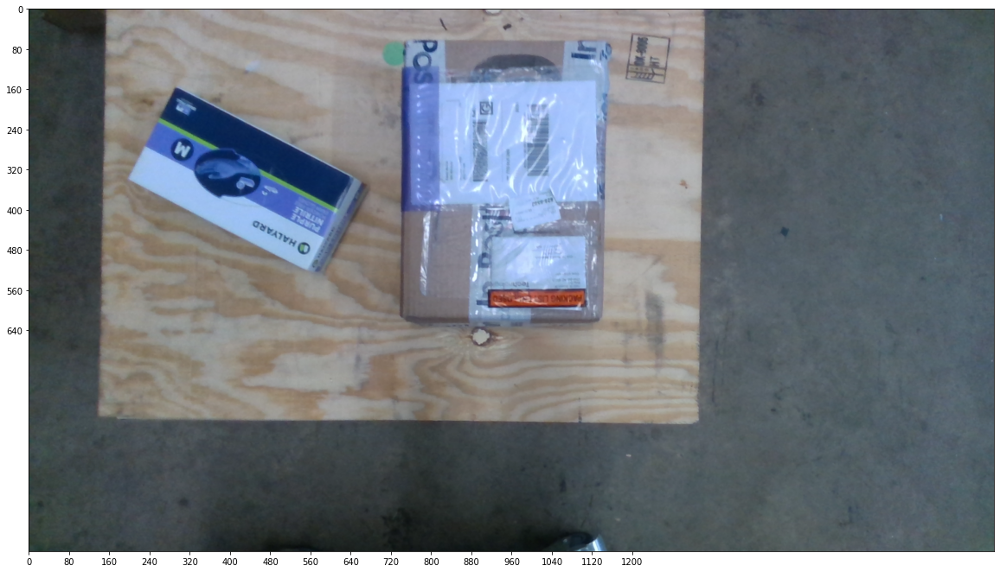

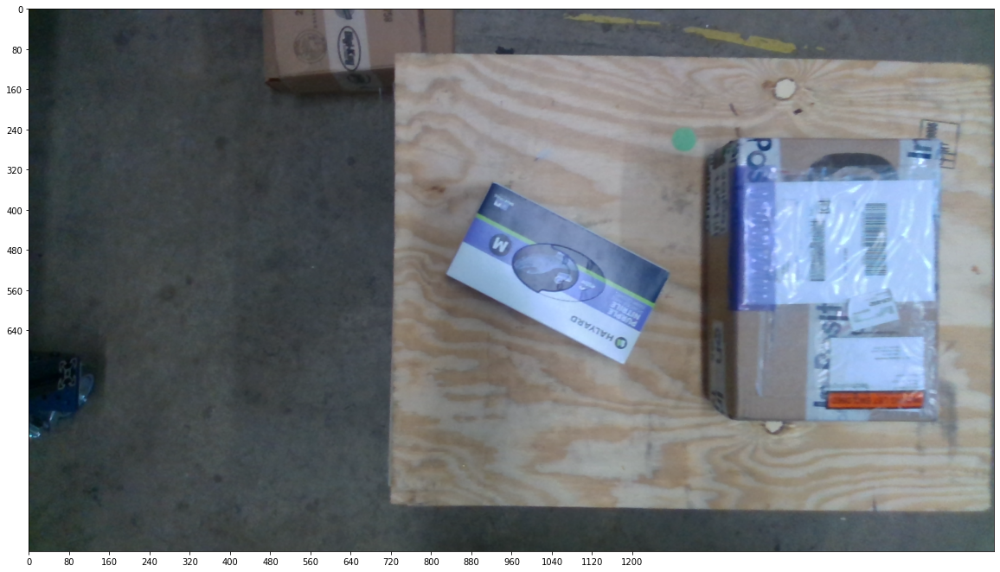

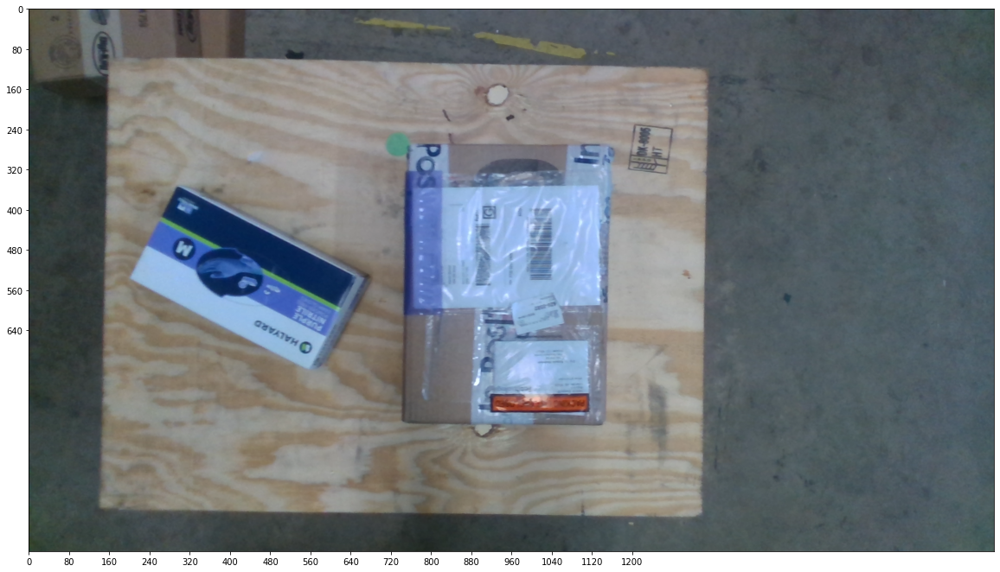

In [5]:
#-x, -y, -z
robot.arm.move_to_common_pose(common_pose)
robot.arm.translate_tcp([x_range[0],y_range[0],-z_range[0]])
robot.get_and_view_color()

#+x, -y, -z
robot.arm.move_to_common_pose(common_pose)
robot.arm.translate_tcp([x_range[1],y_range[0],-z_range[0]])
robot.get_and_view_color()

#-x, +y, -z
robot.arm.move_to_common_pose(common_pose)
robot.arm.translate_tcp([x_range[0],y_range[1],-z_range[0]])
robot.get_and_view_color()

#+x, +y, -z
robot.arm.move_to_common_pose(common_pose)
robot.arm.translate_tcp([x_range[1],y_range[1],-z_range[0]])
robot.get_and_view_color()

#-x, -y, +z
robot.arm.move_to_common_pose(common_pose)
robot.arm.translate_tcp([x_range[0],y_range[0],-z_range[1]])
robot.get_and_view_color()

#+x, -y, +z
robot.arm.move_to_common_pose(common_pose)
robot.arm.translate_tcp([x_range[1],y_range[0],-z_range[1]])
robot.get_and_view_color()

#-x, +y, +z
robot.arm.move_to_common_pose(common_pose)
robot.arm.translate_tcp([x_range[0],y_range[1],-z_range[1]])
robot.get_and_view_color()

#+x, +y, +z
robot.arm.move_to_common_pose(common_pose)
robot.arm.translate_tcp([x_range[1],y_range[1],-z_range[1]])
robot.get_and_view_color()

# Test run

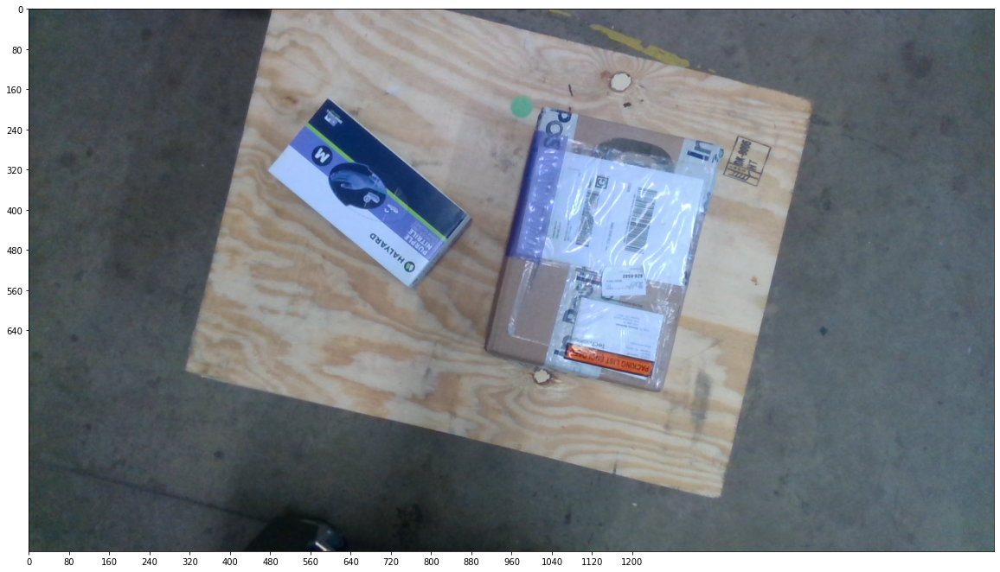

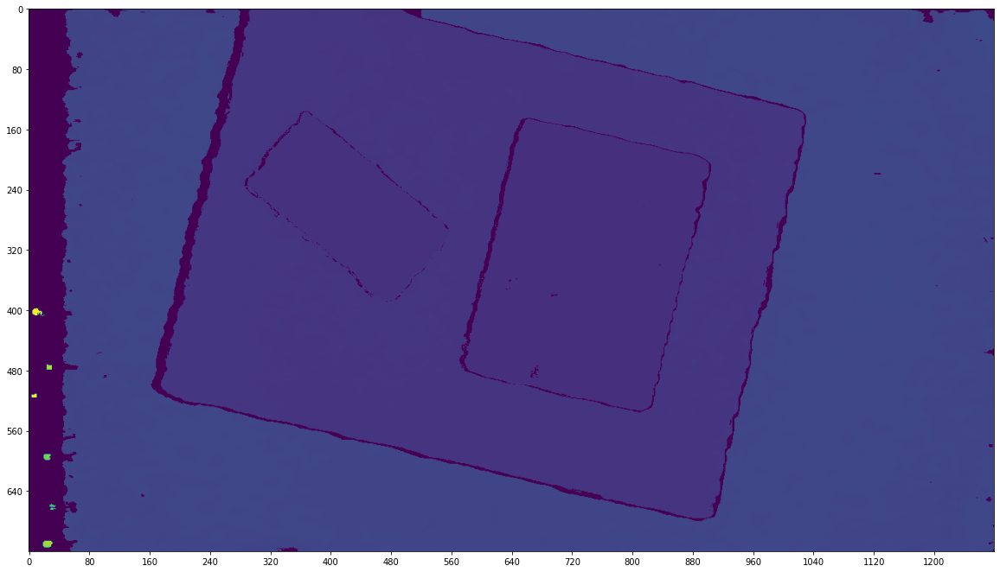

In [6]:
robot.arm.move_to_common_pose('cv_2')

# Generate random pose
pose = rm.poses.translate_pose(robot.arm.get_tcp_pose(),[random.uniform(x_range[0],x_range[1]),random.uniform(y_range[0],y_range[1]),random.uniform(z_range[0],z_range[1])])
rz = random.uniform(math.radians(rz_range[0]), math.radians(rz_range[1]))
pose = rm.poses.rotate_pose(pose, [0,0,rz])
robot.arm.move(pose)
time.sleep(0.5)
model = robot.get_capture()
rm.viewer.show_image(model.color_image)
rm.viewer.show_image(model.depth_image)

# Set File Location

In [13]:
# Set file name
file_name = 'set_8' # Don't include file type
file_dir = 'collected_data/'
file_path = file_dir+file_name
# Check if name is already in use
if path.exists(file_path+'.pklz'):
    print('File already exists running next cell will over write this file')

# Set Number of Captures

In [14]:
number_of_captures = 50

# Run Capture Loop

In [15]:
# Set current file path
if file_path is None: raise Exception('Please set file name')
current_file_path = file_path

# Set file name back to None to force user to reset name
file_path = None

# Move to start pose
robot.arm.move_to_common_pose('cv_2')
start_pose = robot.arm.get_tcp_pose()

# Save setup image
img = robot.camera.get_color_image()
rm.images.save_jpeg(img, current_file_path+'.jpeg')

# Create data set id
data_set_id = file_name

models = []
# Run loop
for i in range(number_of_captures):
    # Generate random pose
    pose = rm.poses.translate_pose(start_pose,[random.uniform(x_range[0],x_range[1]),random.uniform(y_range[0],y_range[1]),random.uniform(z_range[0],z_range[1])])
    rz = random.uniform(math.radians(rz_range[0]), math.radians(rz_range[1]))
    pose = rm.poses.rotate_pose(pose, [0,0,rz])
    robot.arm.move(pose)
    time.sleep(0.5)
    for j in range(5):
        try:
            model = robot.get_capture()
            break
        except:
            print('Camera Fail', i)
            robot.camera.restart_camera()
        if j == 4:
            raise Exception('Total Camera Fail')
    model.data_set_id = data_set_id
    models.append(model)
    
    if i % 10 == 0:
        print(i)
#         f = gzip.open(current_file_path,'wb')
#         pickle.dump(models,f)
#         f.close()
        
f = gzip.open(current_file_path+'.pklz','wb')
pickle.dump(models,f)
f.close()

0
10
Camera Fail 14
20
Camera Fail 29
30
40
Camera Fail 44


# Check File

In [ ]:
f = gzip.open(file,'rb')
loaded_models = pickle.load(f)
f.close()

print(loaded_models)

# Download and delete your data from capturing computer!